In [3]:
from briefcase.case import Case
from briefcase.case_base import CaseBase
from briefcase.enums import incons_enum
import import_ipynb
import pandas as pd
import matplotlib.pyplot as plt
import MushroomsConverter as TC
import big_dataset_utility.utils as BD
import random

historic_splits = [0.25, 0.5, 0.75, 0.95]

def test_constrainted_inconsistency(data_splits, constraint="ALL"):
    historic = data_splits['historic']
    new = data_splits['new']
    
    historic_cases = [Case.from_dict(c) for c in historic]
    cb = CaseBase(historic_cases)
    
    admitted = 0
    for item in new:
        new_case = Case.from_dict(item)
        # test without adding to case base
        if cb.order.admissibility_constraints.is_case_admissible(new_case.reason, new_case.defeated(), constraint):
            admitted += 1
            
    print(f"Number of cases admitted: {admitted}")
    size, inconsistencies = cb.metrics()
    return admitted, size, inconsistencies

def split_data(data):
    data_splits = {}
    for historic_split in historic_splits:
        historic = random.sample(data, k=int(historic_split * len(data)))
        # take 40 samples because max samples when 95% is 45
        new = random.sample(data, k=40)
        data_splits[historic_split] = {'historic': historic, 'new': new}
    return data_splits


In [4]:
# Initial Stats 
data = TC.get_existing_test_data(test_split=0.75)
initial_cases = [Case.from_dict(c) for c in data]
initial_cb = CaseBase(initial_cases)
initial_cb.metrics()
filtered_q3_power = BD.filter_data_by_power(data, 0.74)

Loaded data successfully from 'data/mushrooms-corr-test-0.75.yaml'
Number of cases:  6093
Number of cases associated with inconsistency:  42
Maximum number of edges on a pi case: 302231454903640113807360
Maximum number of edges on a delta case: 302231454894861200654336
Factors for pi: 35
Factors for delta: 44


## Admissibility experiments 
1. Split the data into a set of historic cases, and new cases 
2. Add each 

In [23]:
constraint_colors = {
    'NO_NEW': 'blue',
    'NO_CORRUPTION': 'orange',
    'NO_INVOLVEMENT': 'green',
    'NO_CHANGED_ORDER': 'red',
    'NO_INCONSISTENCY': 'purple',
    'ALL': 'black'
}

def experiment_perc_incons(data, repetitions=100):
    # Initialize results list
    results = []
    
    # Repeat the experiment
    for _ in range(repetitions):
        data_splits = split_data(data)
        
        for historic_split in historic_splits:
            for constraint in [incons_enum.NO_INCONSISTENCY, incons_enum.NO_CHANGED_ORDER, incons_enum.NO_INVOLVEMENT, 
                               incons_enum.NO_NEW, incons_enum.NO_CORRUPTION, incons_enum.ALL]:
                print(f"\nHistoric Split: {historic_split}")
                print(f"Constraint: {constraint.name}")
                
                # Run the experiment
                admitted, cases_size, tainted_cases = test_constrainted_inconsistency(data_splits[historic_split], constraint=constraint)
                
                # Store the results
                results.append({'Historic Split': historic_split, 
                                'Constraint': constraint.name, 
                                'No. cases admitted': admitted,
                                "No. cases": cases_size,
                                "No. inconsistent cases": tainted_cases,
                                "No. total cases for admission": len(data_splits[historic_split]['new'])})
    
    # Convert results to DataFrame for easier manipulation
    results_df = pd.DataFrame(results)
    # Group by Historic Split and Constraint, calculate the average
    average_results = results_df.groupby(['Historic Split', 'Constraint']).mean().reset_index()
    
    plot_all(average_results, repetitions)
    filtered_plot(average_results, repetitions, ['NO_NEW', 'NO_CORRUPTION', 'NO_INVOLVEMENT', 'NO_CHANGED_ORDER'])
    filtered_plot(average_results, repetitions, ['NO_NEW', 'NO_CORRUPTION'])
    return results_df

def filtered_plot(average_results, repetitions, constraints):
    # Calculate the percentage of new cases admitted
    average_results['Percentage new cases admitted'] = average_results['No. cases admitted'] / average_results['No. total cases for admission'] * 100    
    
    # Filter DataFrame for the constraints (B) and (C)
    filtered_df = average_results[average_results['Constraint'].isin(constraints)]
    
    # Plotting
    plt.figure(figsize=(10, 6))

    for constraint in filtered_df['Constraint'].unique():
        sub_df = filtered_df[filtered_df['Constraint'] == constraint]
        plt.plot(sub_df['Historic Split'], sub_df['Percentage new cases admitted'], label=constraint, color=constraint_colors[constraint])

    plt.title(f"Average Percentage of New Cases Admitted with \n {constraints} - ({repetitions} trials)")
    plt.xlabel("Percentage cases in existing case base")
    plt.ylabel("Average percentage of new cases admitted")
    plt.legend()
    plt.grid(True)
    plt.show()
    
    # Plotting
    plt.figure(figsize=(10, 6))
    
    for constraint in filtered_df['Constraint'].unique():
        sub_df = filtered_df[filtered_df['Constraint'] == constraint]
        plt.plot(sub_df['Historic Split'], sub_df['No. cases admitted'], label=constraint, color=constraint_colors[constraint])
    
    plt.title(f"Average Number of New Cases Admitted to a Case Base with \n {constraints} - {repetitions} trials")
    plt.xlabel("Percentage cases in existing case base")
    plt.ylabel("Number of new cases admitted")
    plt.legend()
    plt.grid(True)
    plt.show()

def plot_all(average_results, repetitions):
    # Plotting
    plt.figure(figsize=(10, 6))
    
    for constraint in average_results['Constraint'].unique():
        sub_df = average_results[average_results['Constraint'] == constraint]
        plt.plot(sub_df['Historic Split'], sub_df['No. cases admitted'], label=constraint, color=constraint_colors[constraint])
    
    plt.title(f"Average Number of New Cases Admitted to a Case Base with all - {repetitions} trials")
    plt.xlabel("Percentage cases in existing case base")
    plt.ylabel("Number of new cases admitted")
    plt.legend()
    plt.grid(True)
    plt.show()


Historic Split: 0.25
Constraint: NO_INCONSISTENCY
Number of cases admitted: 0
Number of cases:  1523
Number of cases associated with inconsistency:  9
Maximum number of edges on a pi case: 302231454903640113807360
Maximum number of edges on a delta case: 302231454894861200654336
Factors for pi: 35
Factors for delta: 44

Historic Split: 0.25
Constraint: NO_CHANGED_ORDER
Number of cases admitted: 38
Number of cases:  1523
Number of cases associated with inconsistency:  9
Maximum number of edges on a pi case: 302231454903640113807360
Maximum number of edges on a delta case: 302231454894861200654336
Factors for pi: 35
Factors for delta: 44

Historic Split: 0.25
Constraint: NO_INVOLVEMENT
Number of cases admitted: 40
Number of cases:  1523
Number of cases associated with inconsistency:  9
Maximum number of edges on a pi case: 302231454903640113807360
Maximum number of edges on a delta case: 302231454894861200654336
Factors for pi: 35
Factors for delta: 44

Historic Split: 0.25
Constraint: 

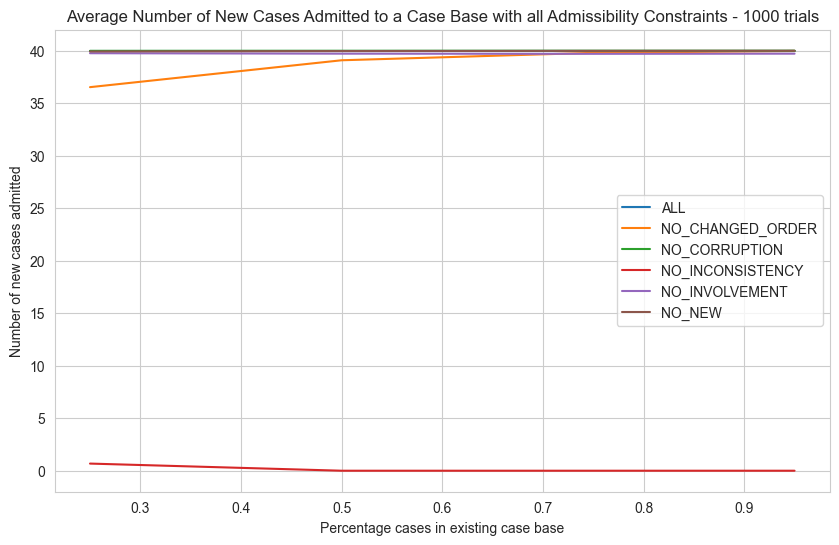

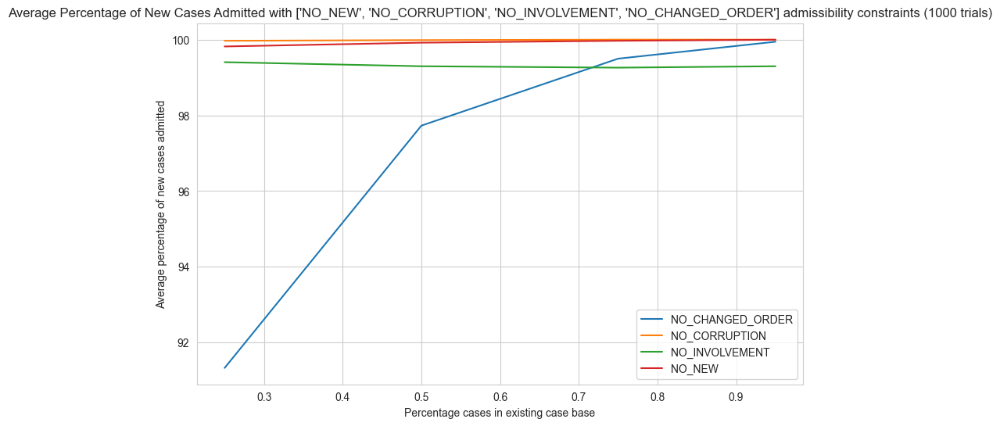

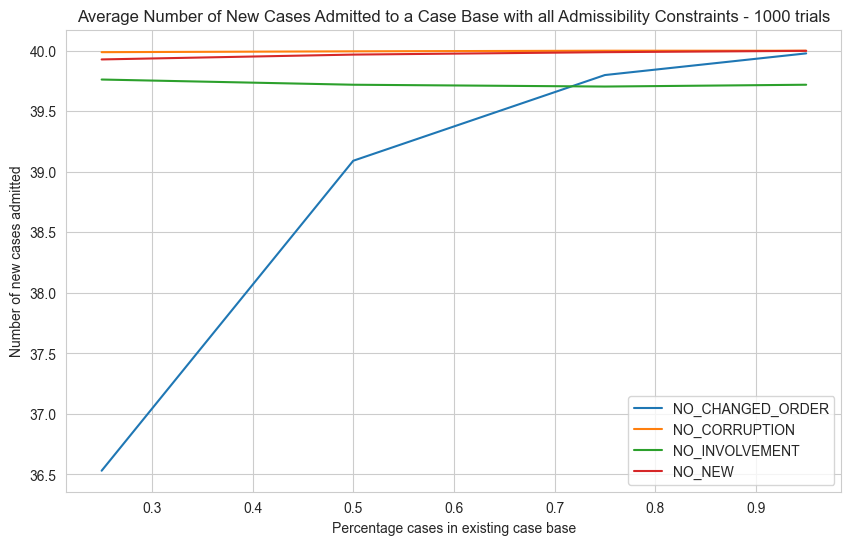

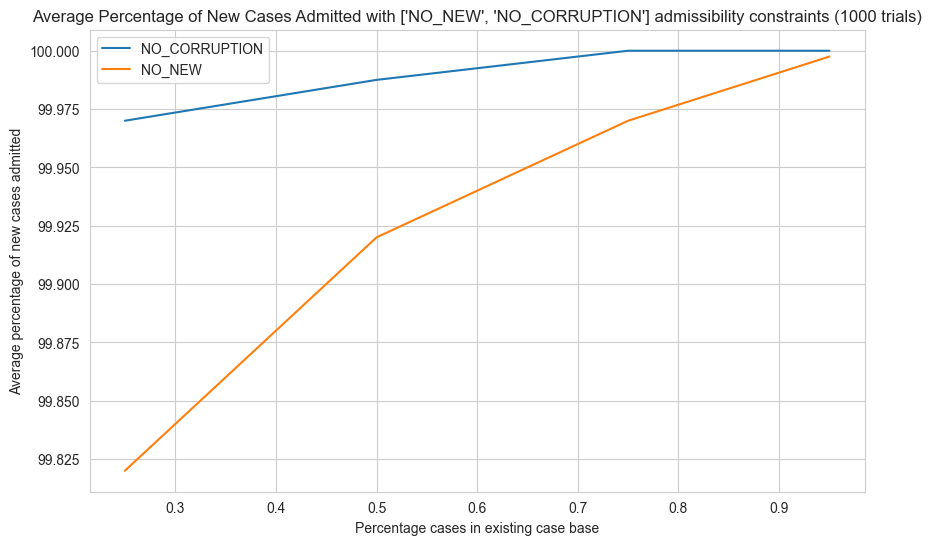

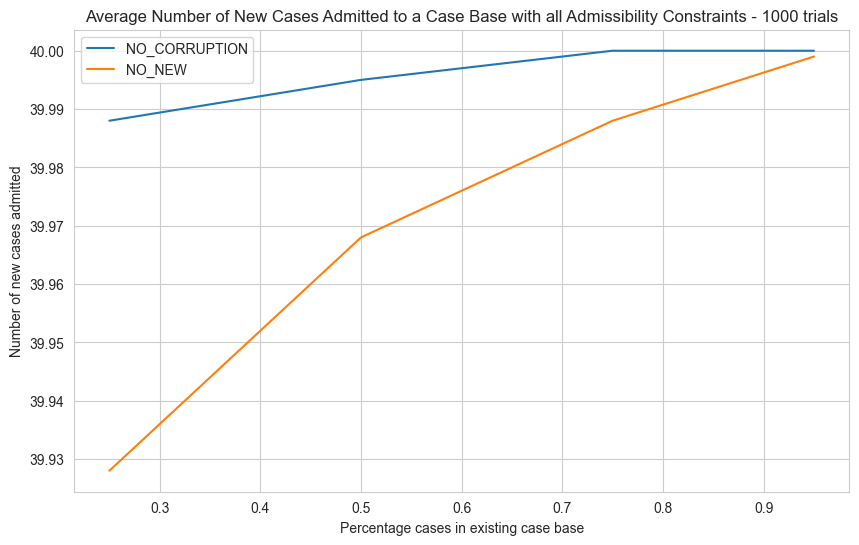

In [11]:
results_df = experiment_perc_incons(data, 1000)

In [ ]:
experiment_perc_incons(filtered_q3_power, 1000)
# lower power, any pair of cases smaller circle, more no involvement, less priority order thing

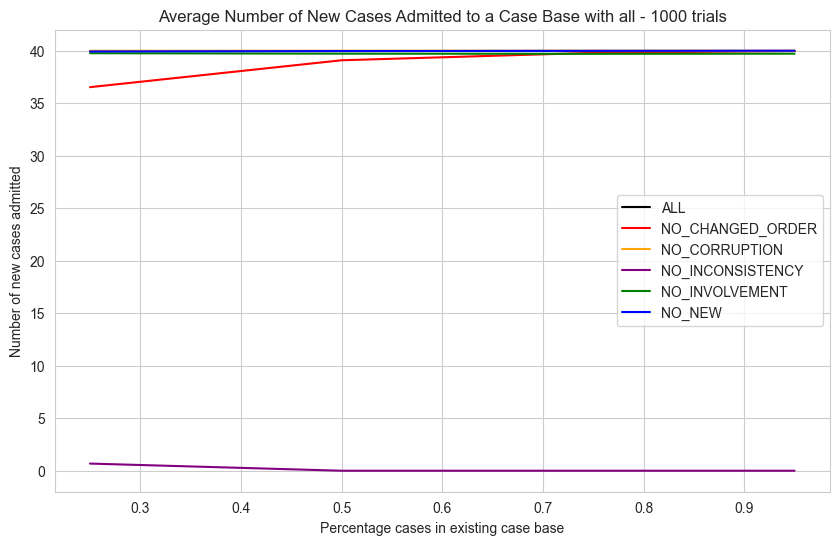

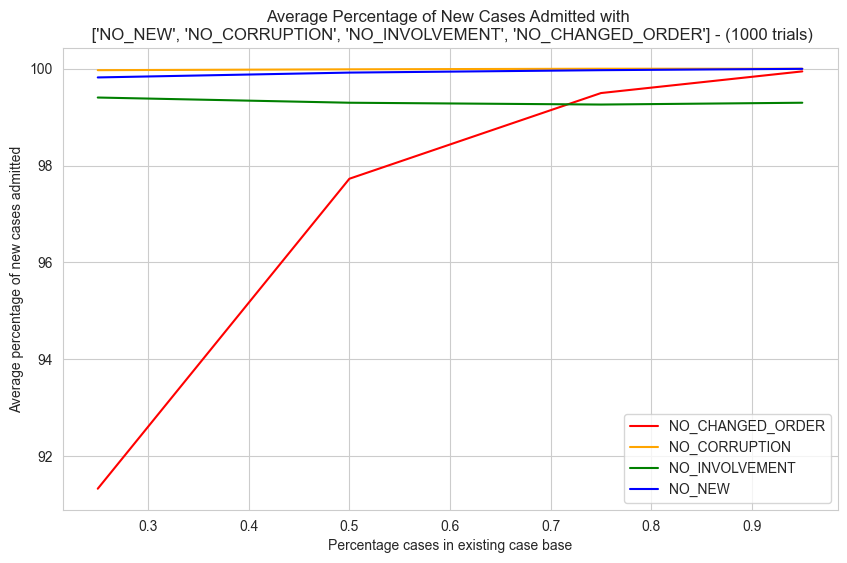

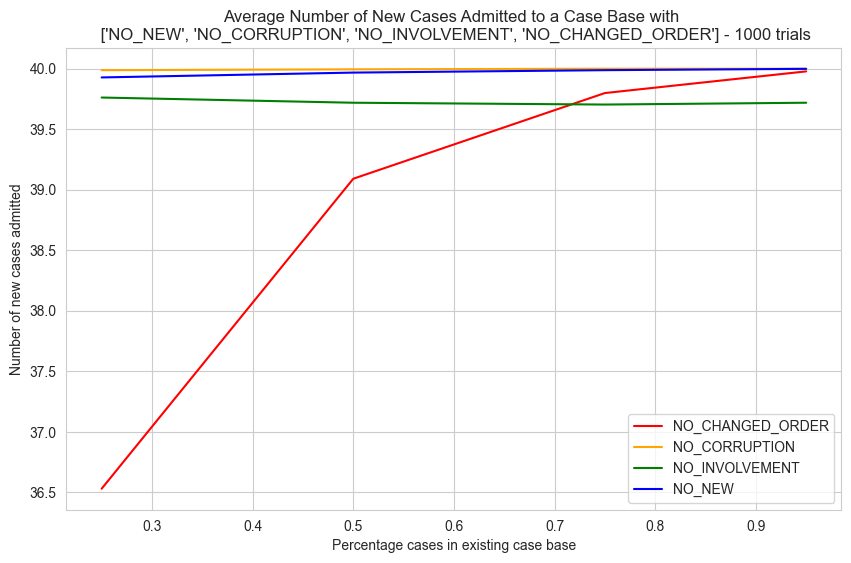

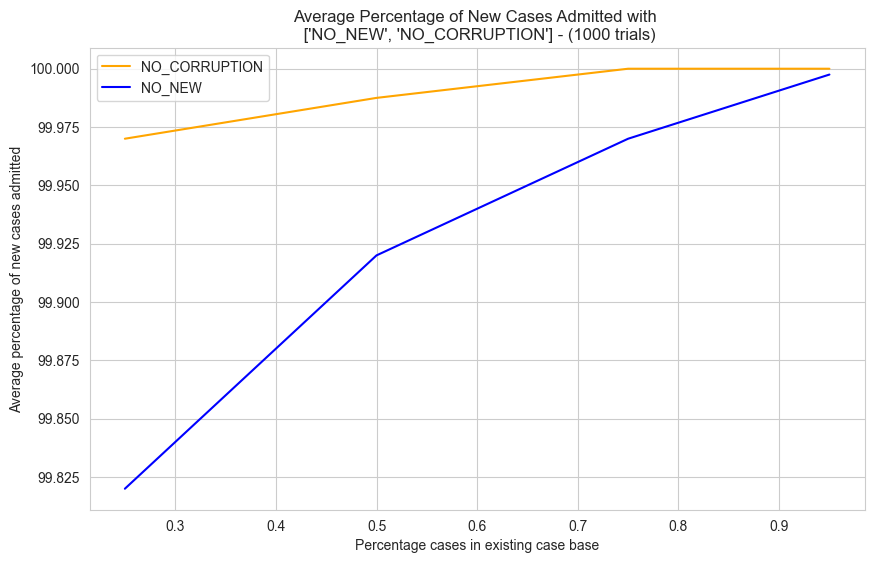

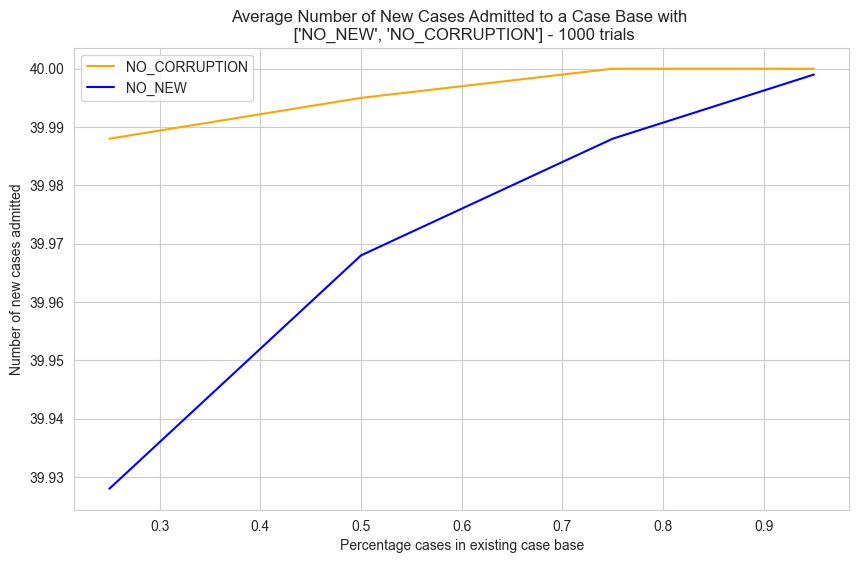

In [24]:
average_results = results_df.groupby(['Historic Split', 'Constraint']).mean().reset_index()
plot_all(average_results, 1000)
filtered_plot(average_results, 1000, ['NO_NEW', 'NO_CORRUPTION', 'NO_INVOLVEMENT', 'NO_CHANGED_ORDER'])
filtered_plot(average_results, 1000, ['NO_NEW', 'NO_CORRUPTION'])

In [25]:
# Define the data as a list of lists
telco_data = [
    [0.25, 'ALL', 40.000, 1027.527, 704.431, 40.0, 100.0000],
    [0.25, 'NO_CHANGED_ORDER', 30.099, 1027.527, 704.431, 40.0, 75.2475],
    [0.25, 'NO_CORRUPTION', 39.468, 1027.527, 704.431, 40.0, 98.6700],
    [0.25, 'NO_INCONSISTENCY', 0.000, 1027.527, 704.431, 40.0, 0.0000],
    [0.25, 'NO_INVOLVEMENT', 18.608, 1027.527, 704.431, 40.0, 46.5200],
    [0.25, 'NO_NEW', 39.042, 1027.527, 704.431, 40.0, 97.6050],
    [0.50, 'ALL', 40.000, 2055.165, 1609.745, 40.0, 100.0000],
    [0.50, 'NO_CHANGED_ORDER', 30.784, 2055.165, 1609.745, 40.0, 76.9600],
    [0.50, 'NO_CORRUPTION', 39.813, 2055.165, 1609.745, 40.0, 99.5325],
    [0.50, 'NO_INCONSISTENCY', 0.000, 2055.165, 1609.745, 40.0, 0.0000],
    [0.50, 'NO_INVOLVEMENT', 15.715, 2055.165, 1609.745, 40.0, 39.2875],
    [0.50, 'NO_NEW', 39.695, 2055.165, 1609.745, 40.0, 99.2375],
    [0.75, 'ALL', 40.000, 3083.127, 2593.475, 40.0, 100.0000],
    [0.75, 'NO_CHANGED_ORDER', 30.945, 3083.127, 2593.475, 40.0, 77.3625],
    [0.75, 'NO_CORRUPTION', 39.931, 3083.127, 2593.475, 40.0, 99.8275],
    [0.75, 'NO_INCONSISTENCY', 0.000, 3083.127, 2593.475, 40.0, 0.0000],
    [0.75, 'NO_INVOLVEMENT', 13.907, 3083.127, 2593.475, 40.0, 34.7675],
    [0.75, 'NO_NEW', 39.899, 3083.127, 2593.475, 40.0, 99.7475],
    [0.95, 'ALL', 40.000, 3904.854, 3403.714, 40.0, 100.0000],
    [0.95, 'NO_CHANGED_ORDER', 31.120, 3904.854, 3403.714, 40.0, 77.8000],
    [0.95, 'NO_CORRUPTION', 39.987, 3904.854, 3403.714, 40.0, 99.9675],
    [0.95, 'NO_INCONSISTENCY', 0.000, 3904.854, 3403.714, 40.0, 0.0000],
    [0.95, 'NO_INVOLVEMENT', 12.804, 3904.854, 3403.714, 40.0, 32.0100],
    [0.95, 'NO_NEW', 39.982, 3904.854, 3403.714, 40.0, 99.9550]
]

# Define column names
columns = ['Historic Split', 'Constraint', 'No. cases admitted', 'No. cases', 'No. inconsistent cases', 'No. total cases for admission', 'Percentage new cases admitted']
telco_average_df = pd.DataFrame(telco_data, columns=columns)


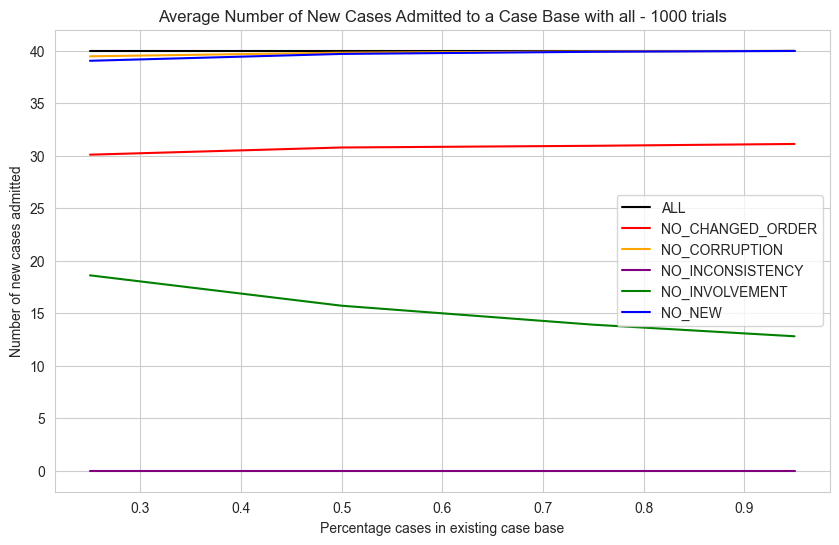

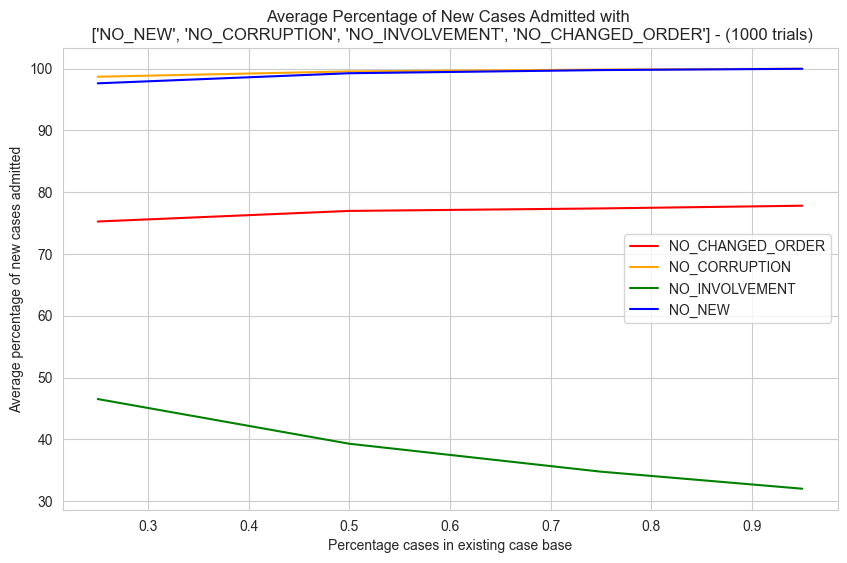

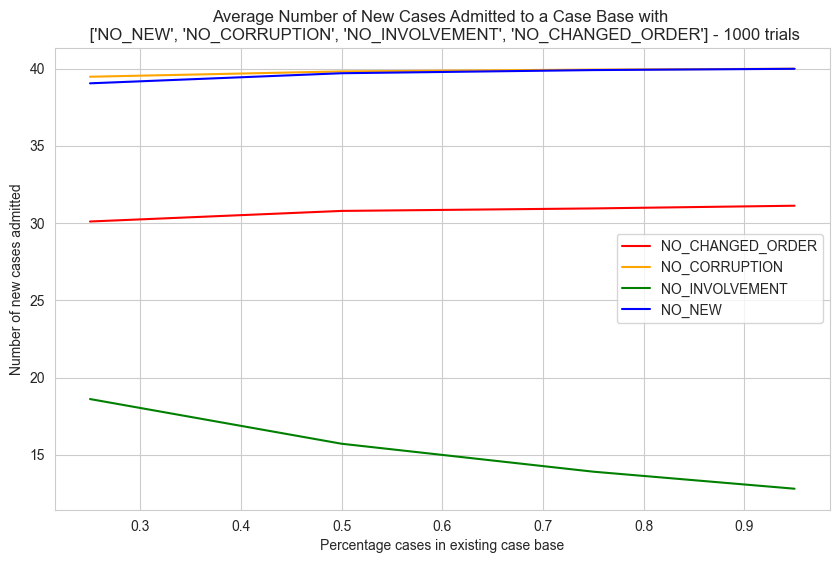

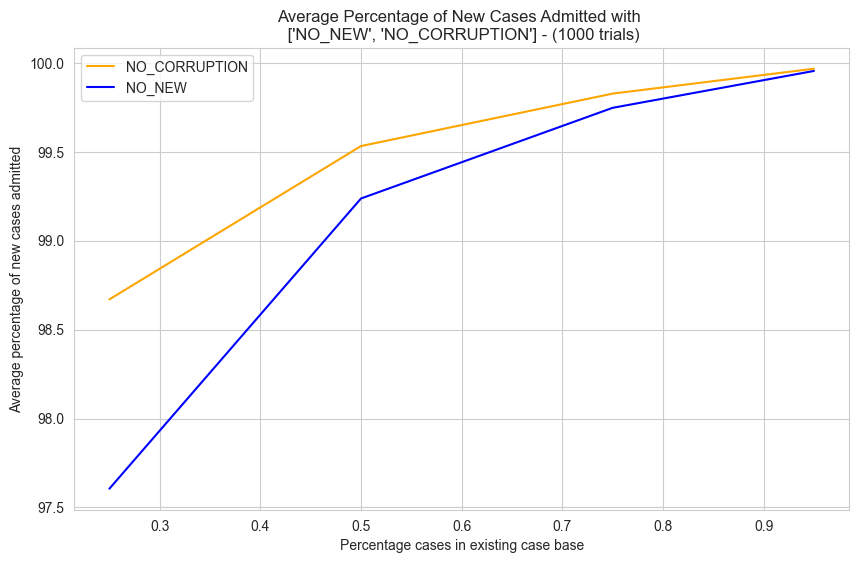

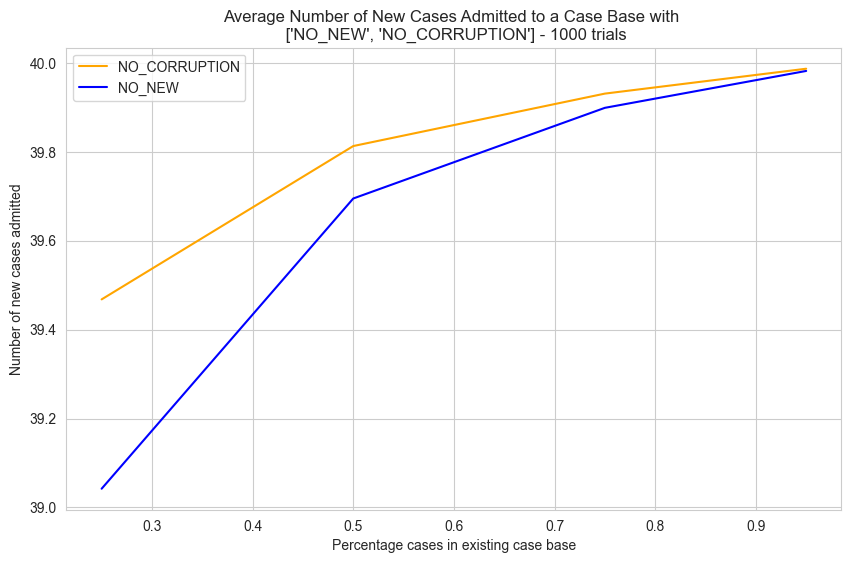

In [26]:
plot_all(telco_average_df, 1000)
filtered_plot(telco_average_df, 1000, ['NO_NEW', 'NO_CORRUPTION', 'NO_INVOLVEMENT', 'NO_CHANGED_ORDER'])
filtered_plot(telco_average_df, 1000, ['NO_NEW', 'NO_CORRUPTION'])

In [12]:
results_df

,Historic Split,Constraint,No. cases admitted,No. cases,No. inconsistent cases,No. total cases for admission
0,0.25,NO_INCONSISTENCY,0,1523,9,40
1,0.25,NO_CHANGED_ORDER,38,1523,9,40
2,0.25,NO_INVOLVEMENT,40,1523,9,40
3,0.25,NO_NEW,40,1523,9,40
4,0.25,NO_CORRUPTION,40,1523,9,40
...,...,...,...,...,...,...
23995,0.95,NO_CHANGED_ORDER,40,5788,39,40
23996,0.95,NO_INVOLVEMENT,40,5788,39,40
23997,0.95,NO_NEW,40,5788,39,40
23998,0.95,NO_CORRUPTION,40,5788,39,40


In [13]:
fifty_results_df = results_df[results_df["Historic Split"]==0.5]
fifty_results_df

,Historic Split,Constraint,No. cases admitted,No. cases,No. inconsistent cases,No. total cases for admission
6,0.5,NO_INCONSISTENCY,0,3046,21,40
7,0.5,NO_CHANGED_ORDER,40,3046,21,40
8,0.5,NO_INVOLVEMENT,40,3046,21,40
9,0.5,NO_NEW,40,3046,21,40
10,0.5,NO_CORRUPTION,40,3046,21,40
...,...,...,...,...,...,...
23983,0.5,NO_CHANGED_ORDER,39,3046,28,40
23984,0.5,NO_INVOLVEMENT,40,3046,28,40
23985,0.5,NO_NEW,40,3046,28,40
23986,0.5,NO_CORRUPTION,40,3046,28,40


In [17]:
from scipy.stats import ttest_ind

# Separate data for each constraint
no_inconsistency = fifty_results_df[fifty_results_df['Constraint'] == 'NO_NEW']
no_changed_order = fifty_results_df[fifty_results_df['Constraint'] == 'NO_CORRUPTION']

# Perform t-test for a numerical variable (e.g., 'Value1') between two constraint groups
t_statistic, p_value = ttest_ind(no_inconsistency['No. cases admitted'], no_changed_order['No. cases admitted'])

# Print the p-value
print("p-value:", p_value)
print(t_statistic)

# Evaluate the p-value to determine significance
if p_value < 0.05:
    print("The results are statistically significant.")
else:
    print("The results are not statistically significant.")

p-value: 7.158977164001961e-06
-4.500813533871587
The results are statistically significant.


In [18]:
# Separate data for each constraint
no_inconsistency = fifty_results_df[fifty_results_df['Constraint'] == 'NO_INVOLVEMENT']
no_changed_order = fifty_results_df[fifty_results_df['Constraint'] == 'NO_CHANGED_ORDER']

# Perform t-test for a numerical variable (e.g., 'Value1') between two constraint groups
t_statistic, p_value = ttest_ind(no_inconsistency['No. cases admitted'], no_changed_order['No. cases admitted'])

# Print the p-value
print("p-value:", p_value)
print(t_statistic)

# Evaluate the p-value to determine significance
if p_value < 0.05:
    print("The results are statistically significant.")
else:
    print("The results are not statistically significant.")

p-value: 8.626294481949808e-71
18.51945122746958
The results are statistically significant.
